In [1]:
adj.mat <- read.csv("tags_adjacency_martix.csv", header = TRUE, stringsAsFactors = FALSE)
rownames(adj.mat) <- adj.mat$X
adj.mat <- as.matrix(adj.mat[,-1])

Дана выборка из всех вопросов на StackOverflow с тегом `python` за какое-то время. Данные представляют собой матрицу смежности, в которой для каждого тега $t_1$ и каждого тега $t_2$ указано $n\left(t_1, t_2\right)$ -- число вопросов, в которых эти теги встретились вместе. Соответственно, $n\left(t_1, t_1\right) = n\left(t_1\right)$ -- общее число вопросов, в которых встретился этот тег.
Задача: классифицировать теги по тематике.

In [2]:
head(adj.mat)

,parameters,osx,emacs,wpf,bash,profile,environment,quotes,model.view.controller,checkbox,,pyuic,python.social.auth,cstringio,pypyodbc,openerp.7,hdf,osx.yosemite,vincent,toplevel,six
parameters,364,0,0,0,6,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
osx,0,3955,13,0,60,0,1,1,0,0,⋯,0,0,0,2,1,0,28,0,0,2
emacs,0,13,556,0,5,0,1,1,0,0,⋯,0,0,0,0,0,0,0,0,0,0
wpf,0,0,0,38,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
bash,6,60,5,0,2201,1,4,1,0,0,⋯,0,0,0,0,0,0,3,0,0,0
profile,0,0,0,0,1,47,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


Понятно, что чем ближе друг к другу теги по тематике, тем больше у них общих вопросов. Понятно также, что никакую "настоящую" метрику на основании числа общих вопросов мы получить не можем, так как не будет выполняться правило треугольника: для двух тегов, которые никогда не встречались вместе, расстояние от каждого от них до тега `python` меньше $\infty$, тогда как расстояние между ними самими -- бесконечно большое. Тем не менее, мы можем посчитать какой-нибудь индекс непохожести (dissimilarity) и попробовать всё же провести кластеризацию.

$$\exists\: d\left(t_1,t_2\right) = 1 - \frac{2n\left(t_1, t_2\right)}{n\left(t_1\right) + n\left(t_2\right)}$$
Пусть индексом непохожести будет такое $d$, равное 0, когда теги всегда встречаются только в паре, и равное 1, когда теги никогда не встречались вместе. Но так как наша матрица очень разреженная, к примеру, при пересчёте расстояний по формуле для $d$ среднее значение матрицы -- 0.9993, такая мера похожести не даёт вразумительных результатов.

В силу особенностей приведённых данных для иерархической кластеризации кажется более разумным использовать complete linkage: если расстояние между кластерами определяется как $\min_{i\in C_1, j\in C_2} d\left(i, j\right)$ (как в single linkage), то объединяться будут любые два кластера, у которых есть какой-либо общий тег. Но, например, тег `quotes` может быть употреблён как рядом с `matplotlib` (и относиться к особенностям отображения кавычек в подписях к графикам), так и рядом с тегом `django` (под вопросом о какой-нибудь проблеме с отображением кавычек в веб-приложении под управлением этой системы) -- и теги `matplotlib` и `django` при этом имеют слишком мало общего, чтобы соединять их кластеры.

In [3]:
# dist.mat <- adj.mat + diag(adj.mat)
# dist.mat <- t(t(dist.mat) + diag(adj.mat))
# dist.mat <- dist.mat - adj.mat
# dist.mat <- 1 - 2 * adj.mat / dist.mat
# dist.mat <- as.dist(dist.mat)
dist.mat <- as.dist(1 / (adj.mat + 0.0001))

In [6]:
hc <- hclust(dist.mat)

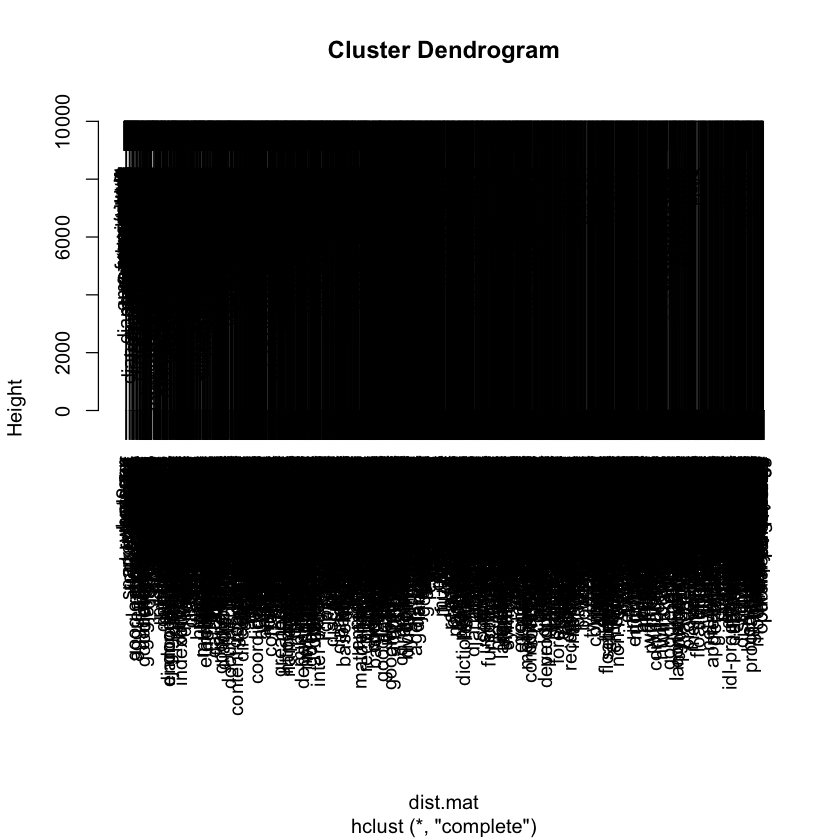

In [7]:
plot(hc)

In [17]:
print(hc)


Call:
hclust(d = dist.mat)

Cluster method   : complete 
Number of objects: 4646 



Удобный способ быстро визуально оценить успешность иерархической кластеризации в случае, когда объектов много, -- посмотреть на объёмы кластеров на заданном уровне. В этом быстро поможет функция `cutree`, которая по истории слияний (возвращаемых в поле `hc$merge`) может вернуть описание кластеров, когда их было заданное число или когда они были на заданном уровнем. Воспользуемся этим методом, чтобы посмотреть, на кластеры какого объёма разбивает наши данные `hclust`.

In [26]:
get.list.of.tags.on.level <- function (hclust.object, n) {
    separated <- cutree(hclust.object, k = n)
    sapply(1:n, function(i) {names(separated[separated == i])})
}

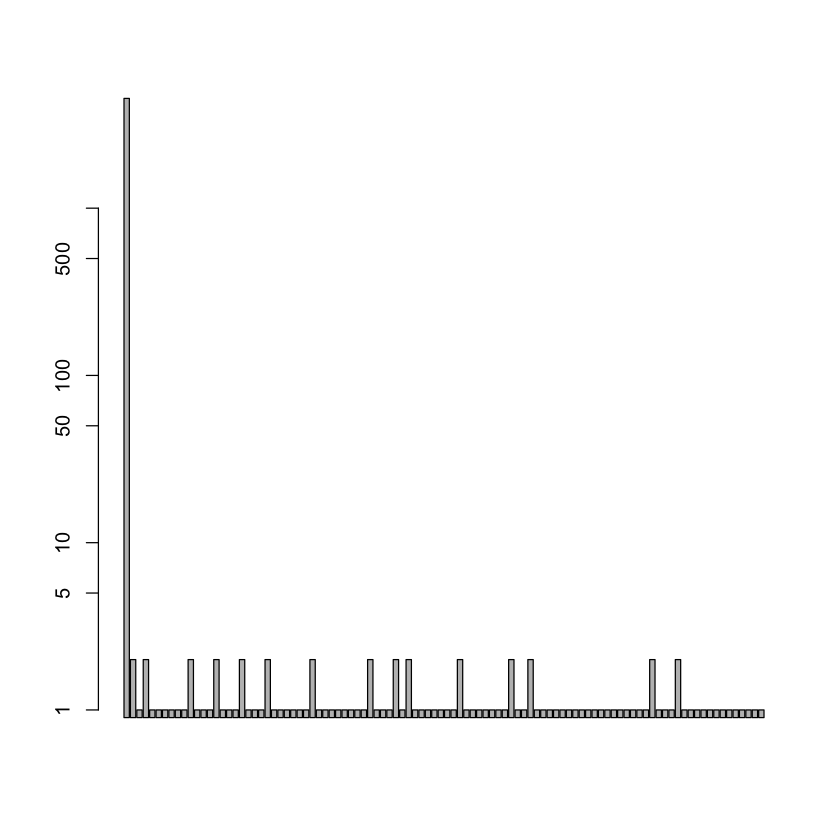

In [60]:
barplot(sapply(get.list.of.tags.on.level(hc, 100), length), log="y")

Таким образом, при разбиении на 1800 кластеров (напомним, что исходно мы рассматриваем 4636 объектов, то есть при равномерном разбиении в кластере должно быть примерно 2.6 объекта) мы получаем один кластер из более 1000 объектов и остальные по 1-2 объекта, то есть никакого осмысленного разбиения.

Требование complete linkage для столь разреженных данных кажется слишком жёстким. Давайте попробуем кажущиеся более естественными варианты, такие как объединение при близости медианных расстояний.

In [37]:
hc.median <- hclust(dist.mat, method = "median")

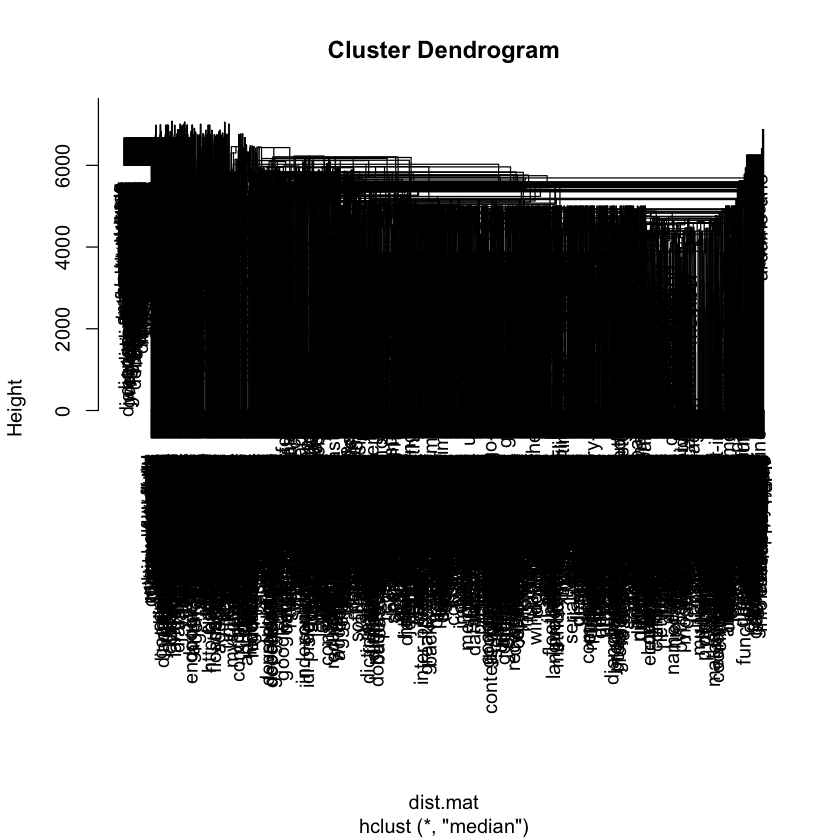

In [48]:
plot(hc.median)

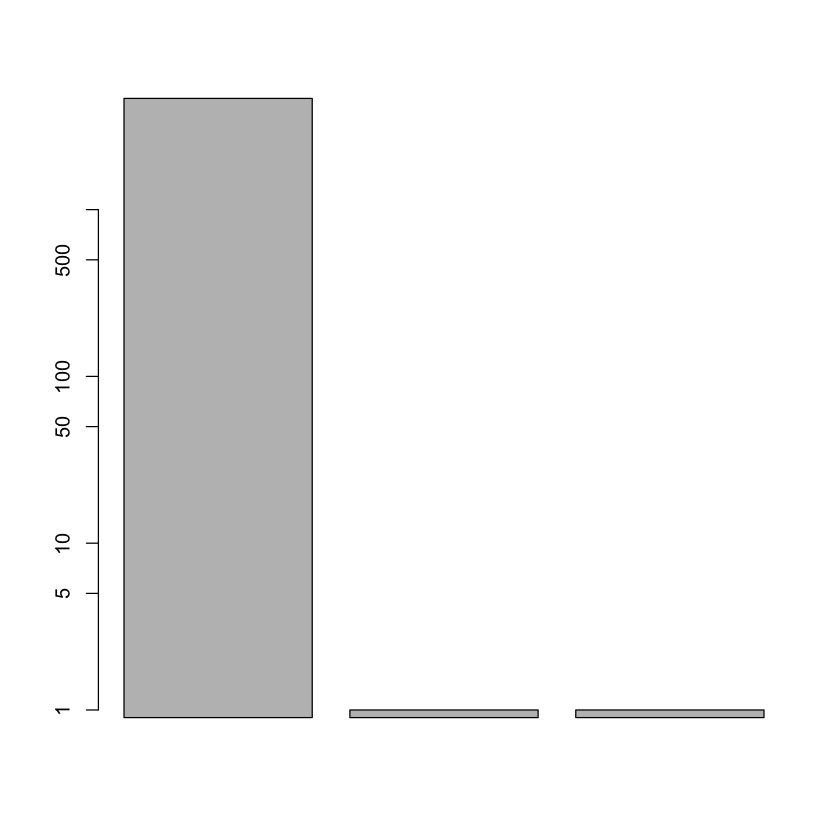

In [61]:
barplot(sapply(get.list.of.tags.on.level(hc.median, 3), length), log="y")

In [ ]:
hc.average <- hclust(dist.mat, method = "average")

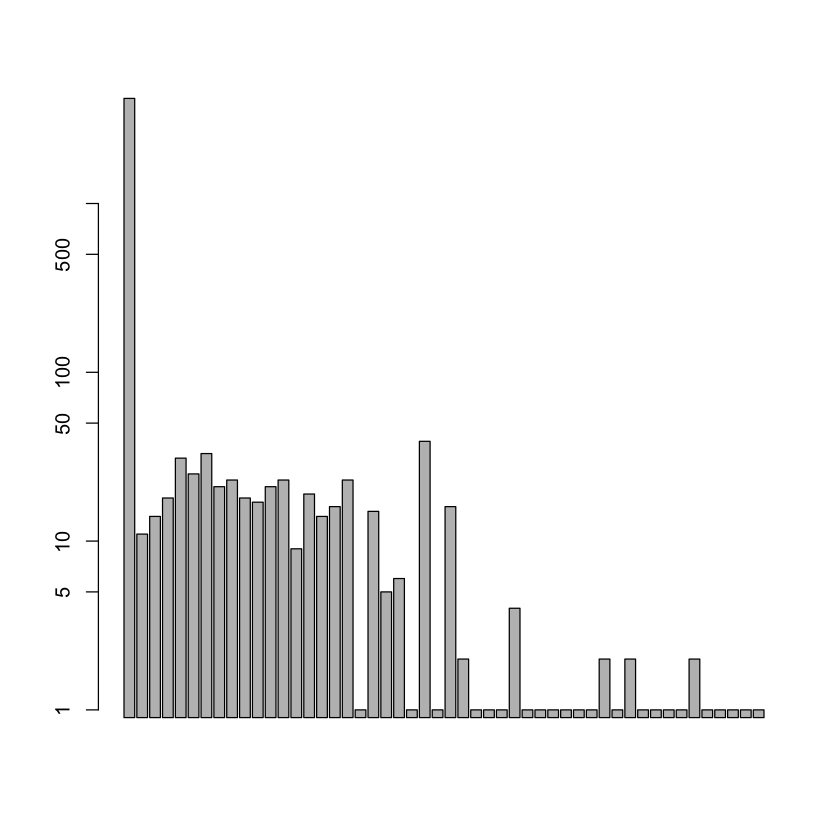

In [55]:
barplot(sapply(get.list.of.tags.on.level(hc.average, 50), length), log="y")

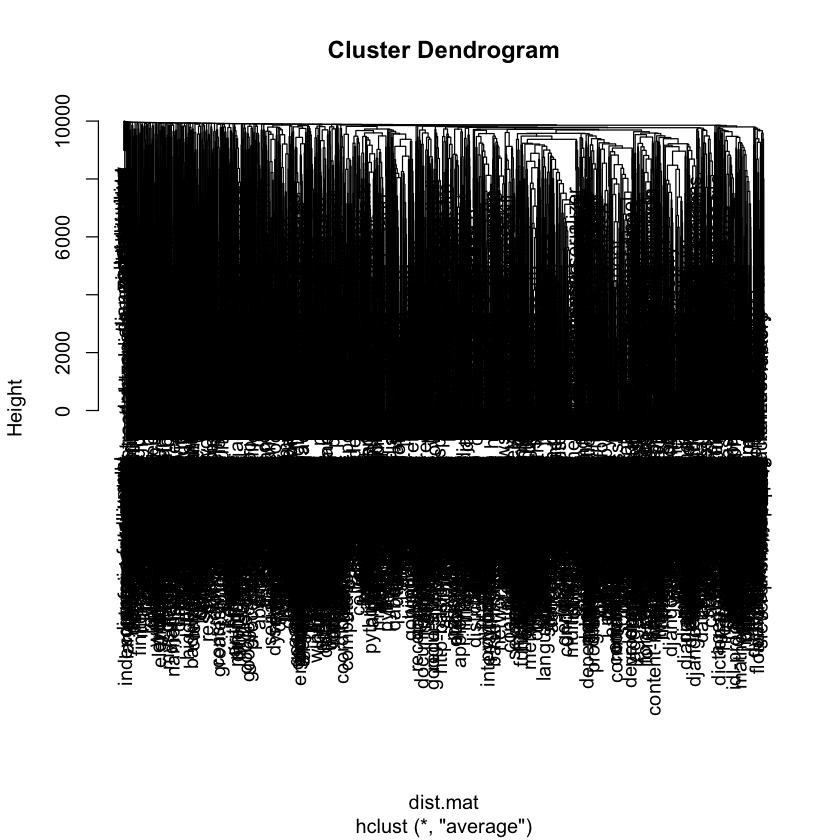

In [44]:
plot(hc.average)

Вывод: критерии объединения в кластеры важны, разумные метрики важны.